# Hemifield stimulation experiment

### This is an attempt to index by subject for easier group-wise analysis later

In [2]:
import os, json, pickle, sys
import nibabel as nb
from sklearn.preprocessing import normalize
from nitime.timeseries import TimeSeries
from nitime.analysis import SpectralAnalyzer, FilterAnalyzer, NormalizationAnalyzer
from linescanning.bin.utils.utils import format_graph
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

# import hrf_estimation
import scipy.signal as signal
import scipy.stats as ss
import scipy.ndimage as ndimage

from joblib import Parallel, delayed

import nideconv as nd
import scipy.io as io
import csv
from prfpy.timecourse import sgfilter_predictions
import pathlib

from linescanning import *

module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

base, place = utils.get_base_dir()

base_dir = os.path.join(base, 'projects', 'hemifield')
model_dir = os.path.join(base_dir, 'derivatives', 'model_fitting')

pathlib.Path(model_dir).mkdir(parents=True, exist_ok=True)
np.set_printoptions(precision=8)

In [17]:
# run_subjects = ['001', '005', '006']
run_subjects = ['003']
session = "ses-2"

TR = 0.105
deleted_first_timepoints = 38
deleted_last_timepoints = 38

initial_deleted_time = TR * deleted_first_timepoints

include_eye = True
# Sample rate and desired cutoff frequencies (in Hz).
fs = 1/TR

hp=0.01
lp=8.0
butter_order = 3
sg_filter_length = 2001

data_psc = []
data_zscore = []
onsets = []

# Create data frames per subject and run
########################################

for sub in run_subjects:

    print("\n------------------------------ processing {sub} ------------------------------".format(sub=f'sub-{sub}'))
    
    subject = f'sub-{sub}'
    session_dir = os.path.join(base_dir, subject, session, 'func')
    f = os.listdir(session_dir)
    nr_runs = []; [nr_runs.append(os.path.join(session_dir, r)) for r in f if "bold.mat" in r]

    if len(nr_runs) != 0:

        for run in range(1,len(nr_runs)+1):

            print(f"  dealing with run-{run}")

            sub_idx = run_subjects.index(sub)+1

            # data_onsets = []
            df_onsets = os.path.join(session_dir, f'{subject}_{session}_task-LR_run-{run}_events.tsv')

            onsets.append(utils.ParseExpToolsFile(df_onsets, subject=sub_idx, run=run).get_onset_df())

            # Read in functional file with ParseFuncFile
            fname = os.path.join(session_dir, f'{subject}_{session}_task-LR_run-{run}_bold.mat')
            func_data = utils.ParseFuncFile(fname, subject=sub_idx, run=run)
            data_zscore.append(func_data.get_zscore())
            data_psc.append(func_data.get_psc())
            
            # onsets.append(mixed_onsets2)

pathlib.Path(os.path.join(model_dir, subject, 'ses-2')).mkdir(parents=True, exist_ok=True)
onsets = pd.concat(onsets).set_index(['subject', 'run', 'event_type']) #; onsets.to_csv(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-onsets.csv'))
data_zscore = pd.concat(data_zscore).set_index(['subject', 'run', 't']) #; data_zscore.to_csv(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-timecourses_zscore.csv'))
data_psc = pd.concat(data_psc).set_index(['subject', 'run', 't']) #; data_psc.to_csv(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-timecourses_psc.csv'))

print('\nDone')


------------------------------ processing sub-003 ------------------------------
  dealing with run-1
  dealing with run-2
  dealing with run-3
  dealing with run-4

Done


In [18]:
data_psc.head()

vox 0      vox 1     vox 2      vox 3     vox 4  \
subject run t                                                           
1       1   0.000 -2.684623 -19.983166 -5.763388   7.967913 -6.487072   
            0.105 -3.918785 -17.392593 -3.972763   8.275104 -5.726659   
            0.210 -3.372794 -13.986140 -1.298743   8.942485 -6.682950   
            0.315 -3.209120 -10.198509 -0.442344  10.511816 -4.623234   
            0.420 -3.247458  -8.003611  1.661479   7.906032 -2.109993   

                      vox 5      vox 6      vox 7      vox 8      vox 9  ...  \
subject run t                                                            ...   
1       1   0.000  0.807047  16.099262 -21.916920  -9.146577 -15.507293  ...   
            0.105 -2.022916  15.337348 -15.930986 -10.349393 -12.186146  ...   
            0.210 -0.352013  13.479078 -12.176824  -7.847291 -12.829572  ...   
            0.315 -1.609683  12.723743 -10.916156  -7.889712 -13.335485  ...   
            0.420 -3.571546   9.704447  -9.310884  -7.027173 -11.695993  ...   

                     vox 710    vox 711   vox 712    vox 713    vox 714  \
subject run t                                                             
1       1   0.000  21.045244 -17.489958  1.303864 -13.870615 -21.281200   
            0.105  21.528185 -12.989503  2.185488 -11.852324 -20.165575   
            0.210  21.265327 -11.812430  2.442670  -8.754438 -18.169044   
            0.315  18.670952 -10.192966  4.592800  -6.803698 -17.598183   
            0.420  15.781593  -8.566648  4.575908  -5.441600 -16.718143   

                    vox 715    vox 716    vox 717    vox 718   vox 719  
subject run t                                                           
1       1   0.000  1.497924 -14.627242 -16.046709  14.236128 -5.900550  
            0.105 -0.318789  -8.927584 -16.322876  15.661896 -4.942030  
            0.210 -2.408397  -6.733346 -14.685535  12.359953 -6.014651  
            0.315 -1.520246  -7.423687  -9.070301   9.364712 -5.744576  
            0.420 -1.912093  -4.946679  -6.077891   5.055308 -7.183063  

[5 rows x 720 columns]

In [32]:
onsets = ParseExpToolsFile(df_onsets, subject=1, run=1)

for ii in ['left', 'right']:
    onsets.onsets_to_txt(subject=1, run=1,condition=ii,fname=os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-onsets_{ii}.txt'))

In [254]:
data_psc.head()

vox 0      vox 1     vox 2      vox 3     vox 4  \
subject run t                                                           
1       1   0.000 -2.684623 -19.983166 -5.763388   7.967913 -6.487072   
            0.105 -3.918785 -17.392593 -3.972763   8.275104 -5.726659   
            0.210 -3.372794 -13.986140 -1.298743   8.942485 -6.682950   
            0.315 -3.209120 -10.198509 -0.442344  10.511816 -4.623234   
            0.420 -3.247458  -8.003611  1.661479   7.906032 -2.109993   

                      vox 5      vox 6      vox 7      vox 8      vox 9  ...  \
subject run t                                                            ...   
1       1   0.000  0.807047  16.099262 -21.916920  -9.146577 -15.507293  ...   
            0.105 -2.022916  15.337348 -15.930986 -10.349393 -12.186146  ...   
            0.210 -0.352013  13.479078 -12.176824  -7.847291 -12.829572  ...   
            0.315 -1.609683  12.723743 -10.916156  -7.889712 -13.335485  ...   
            0.420 -3.571546   9.704447  -9.310884  -7.027173 -11.695993  ...   

                     vox 710    vox 711   vox 712    vox 713    vox 714  \
subject run t                                                             
1       1   0.000  21.045244 -17.489958  1.303864 -13.870615 -21.281200   
            0.105  21.528185 -12.989503  2.185488 -11.852324 -20.165575   
            0.210  21.265327 -11.812430  2.442670  -8.754438 -18.169044   
            0.315  18.670952 -10.192966  4.592800  -6.803698 -17.598183   
            0.420  15.781593  -8.566648  4.575908  -5.441600 -16.718143   

                    vox 715    vox 716    vox 717    vox 718   vox 719  
subject run t                                                           
1       1   0.000  1.497924 -14.627242 -16.046709  14.236128 -5.900550  
            0.105 -0.318789  -8.927584 -16.322876  15.661896 -4.942030  
            0.210 -2.408397  -6.733346 -14.685535  12.359953 -6.014651  
            0.315 -1.520246  -7.423687  -9.070301   9.364712 -5.744576  
            0.420 -1.912093  -4.946679  -6.077891   5.055308 -7.183063  

[5 rows x 720 columns]

In [255]:
data_zscore.head()

vox 0     vox 1     vox 2     vox 3     vox 4     vox 5  \
subject run t                                                                   
1       1   0.000 -0.296433 -2.258610 -0.716367  0.928399 -0.747704  0.098640   
            0.105 -0.432708 -1.965809 -0.493799  0.964192 -0.660058 -0.247245   
            0.210 -0.372420 -1.580793 -0.161429  1.041954 -0.770281 -0.043024   
            0.315 -0.354348 -1.152693 -0.054981  1.224807 -0.532876 -0.196739   
            0.420 -0.358580 -0.904613  0.206516  0.921189 -0.243199 -0.436522   

                      vox 6     vox 7     vox 8     vox 9  ...   vox 710  \
subject run t                                              ...             
1       1   0.000  1.750827 -2.337985 -1.123364 -1.842591  ...  2.422639   
            0.105  1.667967 -1.699436 -1.271091 -1.447970  ...  2.478234   
            0.210  1.465878 -1.298961 -0.963788 -1.524422  ...  2.447975   
            0.315  1.383734 -1.164479 -0.968998 -1.584535  ...  2.149322   
            0.420  1.055378 -0.993237 -0.863063 -1.389729  ...  1.816710   

                    vox 711   vox 712   vox 713   vox 714   vox 715   vox 716  \
subject run t                                                                   
1       1   0.000 -1.859989  0.137394 -1.581821 -2.289878  0.163585 -1.598013   
            0.105 -1.381383  0.230295 -1.351652 -2.169835 -0.034814 -0.975331   
            0.210 -1.256206  0.257395 -0.998366 -1.955007 -0.263014 -0.735612   
            0.315 -1.083982  0.483964 -0.775901 -1.893581 -0.166022 -0.811031   
            0.420 -0.911030  0.482185 -0.620566 -1.798888 -0.208814 -0.540420   

                    vox 717   vox 718   vox 719  
subject run t                                    
1       1   0.000 -1.767373  1.761478 -0.621336  
            0.105 -1.797790  1.937893 -0.520402  
            0.210 -1.617454  1.529333 -0.633351  
            0.315 -0.998996  1.158724 -0.604912  
            0.420 -0.669415  0.625508 -0.756386  

[5 rows x 720 columns]

In [256]:
mixed_onsets2 = pd.DataFrame(onset, columns=['onset', 'event_type'])
mixed_onsets2[0:25]

,onset,event_type
0,6.137,blink
1,10.164,blink
2,13.297,blink
3,16.188,blink
4,18.76,blink
5,23.682,blink
6,24.0645,response
7,24.3644,right
8,24.441,blink
9,25.9895,response


In [257]:
# Model fitting
###############
min_int = -2
max_int = 15
n_regres = None
fitting = 'fir'
method = "psc"

if method == "psc":

    xlabel = "dBOLD SI (%)"

    print("\nPerform model fitting in nideconv with PSC-dataset")
    g_model = nd.GroupResponseFitter(data_psc,
                                    onsets,
                                    input_sample_rate=fs,
                                    concatenate_runs=True,
                                    confounds=None, add_intercept=False)

else:

    xlabel = "zscore"

    print("\nPerform model fitting in nideconv with Zscored dataset")
    g_model = nd.GroupResponseFitter(data_zscore,
                                    onsets,
                                    input_sample_rate=fs,
                                    concatenate_runs=True,
                                    confounds=None, add_intercept=False)
                                    
# Add event for each condition
cond = onsets.reset_index().event_type.unique()
[g_model.add_event(i,
                  basis_set=fitting,
                  n_regressors=n_regres,
                  interval=[min_int,max_int]) for i in cond]
           
g_model.fit()
print("Done")


Perform model fitting in nideconv with PSC-dataset
Done


### Regular

Text(0.5, 0.98, 'HRFs across depth (PSC-data & fir fitting) without confounds')

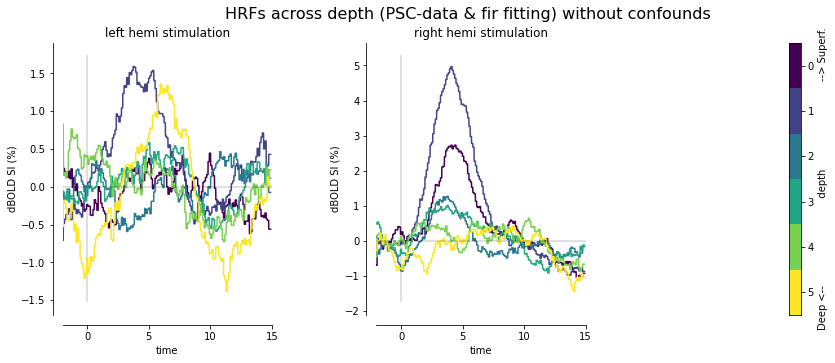

In [258]:
from colour import Color
from linescanning.bin.utils.utils import get_linerange
from matplotlib import cm

orient = ['wm', 'wm', 'pial']
hemi = 'left'
black = Color("black")
white = Color("red")

fig = plt.figure(figsize=(15,5))

gs1 = gridspec.GridSpec(len(run_subjects),3)
# gs1 = gridspec.GridSpec(len(run_subjects),4)
gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
subj = g_model.get_subjectwise_timecourses()

step = 0

# sub-003: r = [358,363]
# sub-005: r = [360,365]

lower_bound = 358
upper_bound = 363

for sub in range(1,len(run_subjects)+1):

    subject = f"sub-{run_subjects[sub-1]}"

    r = [lower_bound,upper_bound]
    nr_vox = len(np.arange(r[0],r[1]+1,1))
    # colors = list(black.range_to(white, nr_vox))
    viridis = cm.get_cmap('viridis', nr_vox)

    # invert gradient if orient == pial
    if orient[sub-1] == "pial":
        colors.reverse()

    #---------------------------------------------------------------------------------------------------------------------------------------------
    # Loop through the dataframe    
    tmp = subj.reset_index()
    tmp = tmp[(tmp['subject'] == sub)]
    # subj_001 = subj_001 = subj.reset_index()
    tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

    # for i,pp in enumerate(['left', 'right', 'response']):
    # for i,pp in enumerate(['left', 'right', 'blink']):
    # for i,pp in enumerate(['left', 'right', 'response', 'blink']):
    for i,pp in enumerate(['left', 'right']):
    # for i,pp in enumerate(['right']):
        
        # titles = ['left hemi stimulation', 'right hemi stimulation', 'button response']
        # titles = ['left hemi stimulation', 'right hemi stimulation', 'eye blink']
        # titles = ['left hemi stimulation', 'right hemi stimulation', 'button response', 'eye blink]
        titles = ['left hemi stimulation', 'right hemi stimulation']
        # titles = ['right hemi stimulation']
        
        vox_nr = 0
        min_val, max_val = 0,0
        g = fig.add_subplot(gs1[step])
        all_vox = []
        for x in np.arange(r[0],r[1]+1,1):
            tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
            yy = tmp.droplevel([0]).iloc[:, x][pp].values
            all_vox.append(yy)
            # get mimimum and maximum of graph for later formatting
            if min(yy) < min_val:
                min_val = min(yy)
            
            if max(yy) > max_val:
                max_val = max(yy)

            img = g.plot(tt,yy, color=viridis(vox_nr/nr_vox))
            # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color=colors[vox_nr].hex)
            format_graph('time', xlabel, axis=False, leg=False, box=False, title=titles[i], out=None)
            vox_nr += 1
    
        # g.axes.xaxis.set_ticklabels([])
        g.set_xlim((min_int, max_int))
        g.axhline(0, color='black', lw=0.25)
        interval = np.round(abs(min_val)+max_val/2,0)
        # g.set_yticks(list(np.arange(np.round(min_val,1), np.round(max_val,1),np.round(interval/4,2))))
        step += 1

        sns.despine(offset=10)

        g.vlines(x=0, ymin=g.get_ylim()[0],ymax=g.get_ylim()[1], color='black', lw=0.25)
        
    cb_axis = fig.add_subplot(gs1[step])
    cb_axis.imshow(np.arange(0,nr_vox,1)[:,np.newaxis], aspect=4)
    cb_axis.set_xticks([])
    cb_axis.yaxis.tick_right()
    cb_axis.yaxis.set_label_position('right')
    cb_axis.set_ylabel("Deep <--                            depth                            --> Superf.")

fig.suptitle("HRFs across depth ({}-data & {} fitting) without confounds".format(method.upper(), fitting.lower()), fontsize=16)
# fig.axes.get_xaxis().set_ticks([])
# plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-hrfs_{method.lower()}_{fitting.lower()}.png'), transparant=True)


### Add negative offset at t=0

In [10]:
# from linescanning.utils import find_nearest
# from colour import Color
# from linescanning.bin.utils.utils import get_linerange
# from matplotlib import cm

# orient = ['wm', 'wm', 'pial']
# hemi = 'left'
# black = Color("black")
# white = Color("red")

# fig = plt.figure(figsize=(15,5))
# gs1 = gridspec.GridSpec(len(run_subjects),3)
# gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
# subj = g_model.get_subjectwise_timecourses()

# step = 0

# for sub in range(1,len(run_subjects)+1):

#     subject = f"sub-{run_subjects[sub-1]}"

#     r = [357,362]
#     nr_vox = len(np.arange(r[0],r[1]+1,1))
#     # colors = list(black.range_to(white, nr_vox))
#     viridis = cm.get_cmap('viridis', nr_vox)

#     # invert gradient if orient == pial
#     if orient[sub-1] == "pial":
#         colors.reverse()

#     #---------------------------------------------------------------------------------------------------------------------------------------------
#     # Loop through the dataframe    
#     tmp = subj.reset_index()
#     tmp = tmp[(tmp['subject'] == sub)]
#     # subj_001 = subj_001 = subj.reset_index()
#     tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

#     # for i,pp in enumerate(['left', 'right', 'response']):
#     for i,pp in enumerate(['left', 'right']):
        
#         # titles = ['left hemi stimulation', 'right hemi stimulation', 'button response']
#         titles = ['left hemi stimulation', 'right hemi stimulation']
        
#         vox_nr = 0
#         min_val, max_val = 0,0
#         g = fig.add_subplot(gs1[step])
#         all_vox = []
#         for x in np.arange(r[0],r[1]+1,1):
#             tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
#             x_arr = tt.to_numpy()
#             zero_point = find_nearest(x_arr,0)[0]

#             if pp == "right":
#                 yy1 = tmp.droplevel([0]).iloc[:, x][pp].values
#                 yy = yy1+abs(yy1[zero_point])
#                 print(f"adding {abs(yy1[zero_point])} to layer {x}")
#             else:
#                 yy = tmp.droplevel([0]).iloc[:, x][pp].values

#             all_vox.append(yy)
#             # get mimimum and maximum of graph for later formatting
#             if min(yy) < min_val:
#                 min_val = min(yy)
            
#             if max(yy) > max_val:
#                 max_val = max(yy)

#             img = g.plot(tt,yy, color=viridis(vox_nr/nr_vox))
#             # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color=colors[vox_nr].hex)
#             format_graph('time', xlabel, axis=False, leg=False, box=False, title=titles[i], out=None)
#             vox_nr += 1
    
#         # g.axes.xaxis.set_ticklabels([])
#         g.set_xlim((min_int, max_int))
#         g.axhline(0, color='black', lw=0.25)
#         g.vlines(x=0, ymin=min_val,ymax=max_val, color='black', lw=0.25)
#         g.spines['left'].set_bounds(min_val,max_val)

#         interval = np.round(abs(min_val)+max_val/2,0)
#         # g.set_yticks(list(np.arange(np.round(min_val,1), np.round(max_val,1),np.round(interval/4,2))))
#         step += 1

#     cb_axis = fig.add_subplot(gs1[step])
#     cb_axis.imshow(np.arange(0,nr_vox,1)[:,np.newaxis], aspect=4)
#     cb_axis.set_xticks([])
#     cb_axis.yaxis.tick_right()
#     cb_axis.yaxis.set_label_position('right')
#     cb_axis.set_ylabel("Deep <--                            depth                            --> Superf.")

# fig.suptitle("HRFs across depth ({}-data & {} fitting) without confounds".format(method.upper(), fitting.lower()), fontsize=16)
# # fig.axes.get_xaxis().set_ticks([])
# # plt.savefig(os.path.join(base_dir, 'code', 'figures', f'{subject}_desc-hrfs_vox-360.png'), transparant=True)


Dealing with condition: left
Dealing with condition: right


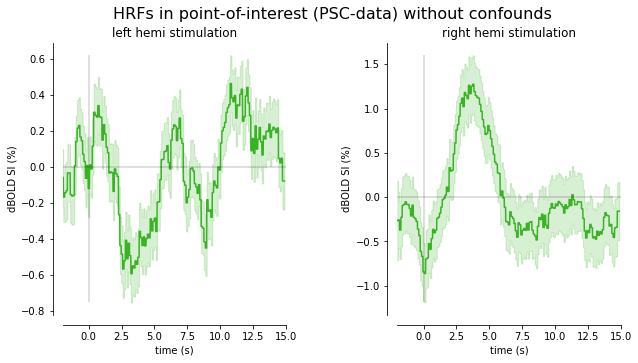

In [11]:
from colour import Color
from linescanning.bin.utils.utils import get_linerange, errorfill

orient = ['wm', 'wm', 'pial']
hemi = 'left'
black = Color("black")
white = Color("red")

fig = plt.figure(figsize=(10,5))
gs1 = gridspec.GridSpec(len(run_subjects),2)
# gs1 = gridspec.GridSpec(len(run_subjects),3)

gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
subj = g_model.get_subjectwise_timecourses()
rfs = g_model._get_response_fitters()
err = rfs.reset_index()[0][0].get_standard_errors_timecourse()
# tt = np.arange(0,20,TR/20)

step = 0
which_vox = 360

for sub in range(1,len(run_subjects)+1):

    subject = f"sub-{run_subjects[sub-1]}"

    r = [which_vox,which_vox]
    nr_vox = len(np.arange(r[0],r[1]+1,1))

    #---------------------------------------------------------------------------------------------------------------------------------------------
    # Loop through the dataframe    
    tmp = subj.reset_index()
    tmp = tmp[(tmp['subject'] == sub)]
    tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

    # for i,pp in enumerate(['left', 'right', 'blink']):
    for i,pp in enumerate(['left', 'right']):
        
        print(f"Dealing with condition: {pp}")
        # titles = ['left hemi stimulation', 'right hemi stimulation', 'eye blink']
        titles = ['left hemi stimulation', 'right hemi stimulation']
        
        vox_nr = 0
        g = fig.add_subplot(gs1[step])
        for x in np.arange(r[0],r[1]+1,1):
            # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color="#39B325")
            
            # get time axis, y axis (BOLD SI), and error values
            tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
            yy = tmp.droplevel([0]).iloc[:, x][pp].values
            error = err.iloc[:,x][pp].values

            # create plot with error bars based on response_fitter.get_standard_errors_timecourse
            errorfill(tt,yy, error, color="#39B325", alpha_fill=0.2)

            # do some additional formatting
            format_graph('time (s)', xlabel, axis=False, leg=False, box=False, title=titles[i], out=None)
            
            vox_nr += 1

        # g.axes.xaxis.set_ticklabels([])
        g.set_xlim((min_int, max_int))
        g.axhline(0, color='black', lw=0.25)
        g.vlines(x=0, ymin=min(yy-error),ymax=max(yy+error), color='black', lw=0.25)
        # g.spines['left'].set_bounds(min(yy-error), max(yy+error))

        sns.despine(offset=10)

        # g.set_yticks(list(np.arange(np.round(min(yy-error),1), np.round(max(yy+error),1),0.5)))
        step += 1

    # plt.xticks(np.arange(0,10),1)
    handles, labels = g.axes.get_legend_handles_labels()
    # fig.legend(handles,labels,loc='upper right', frameon=False)
    fig.suptitle("HRFs in point-of-interest ({}-data) without confounds".format(method.upper()), fontsize=16)
# fig.axes.get_xaxis().set_ticks([])
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_vox-{which_vox}_desc-hrfs_{method.lower()}_{fitting.lower()}.png'), transparant=True)


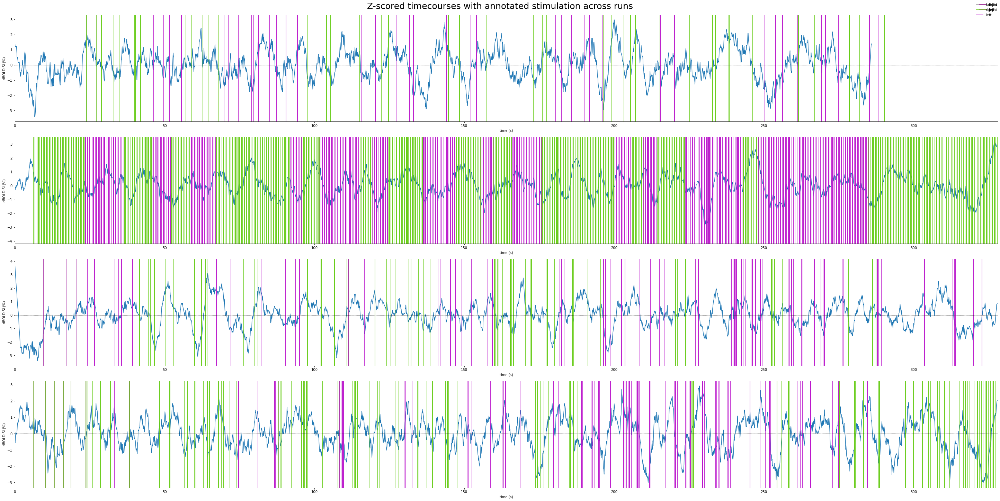

In [57]:
nr_runs = 4
fig = plt.figure(constrained_layout=True, figsize=(40,20))
gs = fig.add_gridspec(nr_runs,1)

for kk in np.arange(0,nr_runs):

    nr = 360
    run = kk+1
    vox_nr = f'vox {nr}'
    vox = pd.DataFrame(data_zscore[vox_nr])
    # vox.reset_index().iloc[0:4000]['vox 360']
    # data_onsets[0][(data_onsets[0]['response'] == 't')
    # vox.loc[['subject']]
    # condition = vox['subject'] == 1
    vox = vox.reset_index()
    index = vox.index
    condition = vox['run'] == run
    idc = index[condition]
    tc = vox.loc[idc][vox_nr]

    fsf = onsets.reset_index()
    condition = fsf['run'] == run
    idc = fsf.index[condition]
    on = fsf.loc[idc]

    x_ax = list(TR*np.arange(tc.shape[-1]))

    if kk != 0:
        tc_ax = fig.add_subplot(gs[kk,:], sharex=tc_ax)
    else:
        tc_ax = fig.add_subplot(gs[kk,:])
    tc_ax.plot(x_ax, tc)
    tc_ax.set_xlim([0,len(tc)*TR])

    for i,r in enumerate(on['onset']):

        if on['event_type'].iloc[i] == "right":
            color = "#65CC14"
            lbl = "right"
        elif on['event_type'].iloc[i] == "left":
            color = "#BB14CC"
            lbl = "left"
        # elif on['event_type'].iloc[i] == "response":
        #     color = "#A19EA1"
        #     lbl = "button"            
        
        tc_ax.axvline(x=r, color=color, label=lbl)

    handles, labels = tc_ax.get_legend_handles_labels()
    newLabels, newHandles = [],[]
    for handle, label in zip(handles, labels):
        if label not in newLabels:
            newLabels.append(label)
            newHandles.append(handle)

    tc_ax.axhline(0, color='black', linestyle='dashed', lw=0.5)
    format_graph(X="time (s)", Y="dBOLD SI (%)")
    fig.legend(newHandles, newLabels,loc='upper right', frameon=False)
    fig.suptitle("Z-scored timecourses with annotated stimulation across runs", fontsize=25)

# Try denoising

In [13]:
from linescanning import image,utils

subj = ['003']

df = {}
for ii in subj:

    print(f"Dealing with sub-{ii}")

    seg_file = utils.get_file_from_substring("segmentations",opj(base_dir,'derivatives','nighres',f'sub-{ii}','ses-2'))
    with open(seg_file, 'rb') as pf:
        seg_data = pickle.load(pf)

    df[f'sub-{ii}'] = seg_data
    df[f'sub-{ii}']['ref'] = utils.get_file_from_substring("1slice_run-1_T1w.nii.gz", opj(base_dir, f'sub-{ii}', 'ses-2', 'anat'))
    df[f'sub-{ii}']['line'] = image.create_line_from_slice(df[f'sub-{ii}']['ref'])

Dealing with sub-003


In [14]:
line_fn = image.create_line_from_slice(df[subject]['ref'])
line_data = line_fn.get_fdata()

In [15]:
df[subject]

{'wm': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_label-WM_probseg.nii.gz',
 'gm': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_label-GM_probseg.nii.gz',
 'csf': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_label-CSF_probseg.nii.gz',
 'cortex': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_desc-cruise_cortex.nii.gz',
 'layers': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_desc-layering_layers.nii.gz',
 'depth': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_desc-layering_depth.nii.gz',
 'mask': '/mnt/d/FSL/shared/spinoza/projects/hemifield/derivatives/nighres/sub-003/ses-2/sub-003_ses-1_acq-1slice_desc-spm_mask.nii.gz',
 'ref': '/mnt

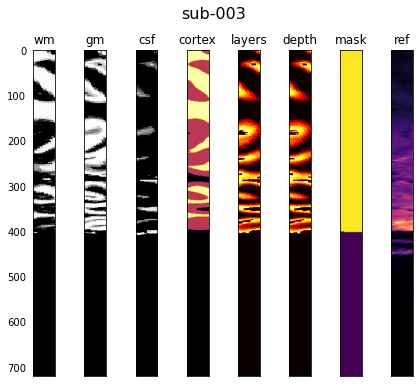

In [16]:
# https://stackoverflow.com/questions/12998430/remove-xticks-in-a-matplotlib-plot

for ii in ['sub-003']:
    ll = df[ii].copy()

    beam = {}
    for i in ll:

        # print(i)
        
        if isinstance(ll[i],str):
            img = nb.load(ll[i])
        elif isinstance(i,nb.Nifti1Image):
            img = i

        if len(img.get_fdata().shape) == 4:
            img_d = np.squeeze(img.get_fdata(), axis=3)
        else:
            img_d = img.get_fdata()

        beam[i] = np.squeeze(np.multiply(img_d,ll['line'].get_fdata().astype(bool))[:,352:368]) # fetch middle 16 voxels and remove 3rd axis

    # https://stackoverflow.com/questions/12998430/remove-xticks-in-a-matplotlib-plot
    fig, axs = plt.subplots(1,len(beam)-1, figsize=(11, 6), facecolor='w', edgecolor='k', sharey=True)
    fig.subplots_adjust(hspace=.5, wspace=-0.8)

    fig.suptitle(ii, fontsize=16)
    axs = axs.ravel()

    cmaps = ['Greys_r','Greys_r','Greys_r','inferno','hot','hot', 'viridis', 'magma']

    for i,r in enumerate(beam):
        if r == "line":
            pass
        else:
            axs[i].set_title(r)
            axs[i].imshow(beam[r], aspect=1/3, cmap=cmaps[i])
            axs[i].set_xticks([])
            axs[i].yaxis.set_ticks_position('none')

    # plt.savefig(os.path.join(model_dir, ii, 'ses-2', f'{ii}_ses-2_desc-beam_segmentations.png'), transparant=True)    

In [17]:
beam = {}
for i in df[subject]:

    if isinstance(df[subject][i], str):
        img = nb.load(df[subject][i])
    elif isinstance(df[subject][i], nb.Nifti1Image):
        img = df[subject][i]

    if len(img.get_fdata().shape) == 4:
        img_d = np.squeeze(img.get_fdata(), axis=3)
    else:
        img_d = img.get_fdata()

    beam[i] = np.squeeze(np.multiply(img_d,line_data.astype(bool))[:,352:368]) # fetch middle 16 voxels and remove 3rd axis

In [18]:
# get average of gm/wm/csf to create a 720x1 array
from sklearn.preprocessing import MinMaxScaler

prob_stack = np.dstack([beam['wm'], beam['gm'], beam['csf']])
prob_stack_avg = np.average(prob_stack, axis=1)
scaler = MinMaxScaler()
scaler.fit(prob_stack_avg)
avg_norm = scaler.transform(prob_stack_avg)

tissue = []
lut = {'wm':2,'gm':1,'csf':0}

# avg_norm has 3 columns; 1st = WM, 2nd = GM, 3rd = CSF
for i,r in enumerate(avg_norm):

    max_val = np.amax(avg_norm[i,:])

    # check tissue type only if non-zero value. If all probabilities are 0 is should be set to zero regardless
    if max_val == 0:
        tissue.append(lut['csf'])
    else:
        # make list of each row for nicer indexing
        idx = list(avg_norm[i,:]).index(max_val)
        if idx == 0:
            # type = 'wm' = '1' in nighres segmentation
            tissue.append(lut['wm'])
        elif idx == 1:
            # type = 'gm' = '2' in nighres segmentation
            tissue.append(lut['gm'])
        elif idx == 2:
            # type = 'csf' = '0' in nighres segmentation
            tissue.append(lut['csf'])

tissue = np.array(tissue)[:,np.newaxis]
tissue.shape

(720, 1)

In [19]:
data_zscore.reset_index()

,subject,run,t,vox 0,vox 1,vox 2,vox 3,vox 4,vox 5,vox 6,...,vox 710,vox 711,vox 712,vox 713,vox 714,vox 715,vox 716,vox 717,vox 718,vox 719
0,1,1,0.000,-0.296433,-2.258610,-0.716367,0.928399,-0.747704,0.098640,1.750827,...,2.422639,-1.859989,0.137394,-1.581821,-2.289878,0.163585,-1.598013,-1.767373,1.761478,-0.621336
1,1,1,0.105,-0.432708,-1.965809,-0.493799,0.964192,-0.660058,-0.247245,1.667967,...,2.478234,-1.381383,0.230295,-1.351652,-2.169835,-0.034814,-0.975331,-1.797790,1.937893,-0.520402
2,1,1,0.210,-0.372420,-1.580793,-0.161429,1.041954,-0.770281,-0.043024,1.465878,...,2.447975,-1.256206,0.257395,-0.998366,-1.955007,-0.263014,-0.735612,-1.617454,1.529333,-0.633351
3,1,1,0.315,-0.354348,-1.152693,-0.054981,1.224807,-0.532876,-0.196739,1.383734,...,2.149322,-1.083982,0.483964,-0.775901,-1.893581,-0.166022,-0.811031,-0.998996,1.158724,-0.604912
4,1,1,0.420,-0.358580,-0.904613,0.206516,0.921189,-0.243199,-0.436522,1.055378,...,1.816710,-0.911030,0.482185,-0.620566,-1.798888,-0.208814,-0.540420,-0.669415,0.625508,-0.756386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12491,1,4,327.495,0.333323,-0.419040,-1.403326,0.680053,-0.727209,-0.947945,1.498555,...,-0.036137,0.482064,0.887595,0.186530,0.781137,1.339203,-0.786903,-0.265105,-0.419994,0.928331
12492,1,4,327.600,0.565092,-0.457087,-1.649330,0.603035,-0.612043,-0.844061,1.632123,...,-0.115853,0.513915,1.409115,0.140739,1.029101,1.135802,-1.049227,0.053981,-0.561371,1.231895
12493,1,4,327.705,0.967633,-0.421764,-1.864377,0.863116,-0.447059,-1.135063,1.720474,...,-0.373777,0.244802,2.104829,-0.059834,0.684742,1.068891,-1.332559,0.357985,-0.464239,1.080136
12494,1,4,327.810,1.205080,-0.669091,-1.830015,1.121403,-0.555191,-1.381973,1.932759,...,-0.115150,0.129006,1.882692,-0.461595,0.907433,1.080222,-1.441206,0.741523,-0.893726,1.266511


In [20]:
# physio = {"wm": mean_wm_tc, "csf": mean_csf_tc}
# physio_df = pd.DataFrame({'subject': qq['subject'], 't': qq['t'].values, 'run': qq['run']})
# physio_df['wm'],physio_df['csf'] = mean_wm_tc,mean_csf_tc
# # physio_df['t'] = qq['t']
# physio_df = physio_df.set_index(['subject', 'run', 't'])
# physio_df

In [21]:
# GET WHITE MATTER VOXEL INDICES
wm_vox = []
for rr,pp in enumerate(beam['cortex']):
    # check if value is 2 at least 15 times to be sure that voxel is white matter
    if np.count_nonzero(pp == 2) > 15:
        wm_vox.append(rr)

wm_vox = np.array(wm_vox)

qq = data_zscore.reset_index()
lo = [f'vox {pp}' for pp in wm_vox]
wm_tc = qq[lo].copy().values

if wm_tc.shape[0] == 0:
    raise ValueError("Could not find WM voxels with the given threshold")
else:
    print(f"WM:  found {wm_tc.shape[-1]} voxels")


# GET CSF VOXEL INDICES
csf_vox = []
for rr,pp in enumerate(beam['cortex']):

    if np.all(beam['mask'][rr]) != 0: # if all is zero, we're likely to be outside of the brain
        # check if value is 0 at least 15 times to be sure that voxel is white matter
        if np.count_nonzero(pp == 0) > 15:
            csf_vox.append(rr)

csf_vox = np.array(csf_vox)

qq = data_zscore.reset_index()
lo = [f'vox {pp}' for pp in csf_vox]
csf_tc = qq[lo].copy().values

if csf_tc.shape[0] == 0:
    raise ValueError("Could not find CSF voxels with the given threshold")
else:
    print(f"CSF: found {csf_tc.shape[-1]} voxels")

WM:  found 79 voxels
CSF: found 14 voxels


In [22]:
from sklearn.decomposition import PCA
n_wm_comp = 5
n_csf_comp = 5

wm_pca = PCA(n_components=n_wm_comp)
wm_comp = wm_pca.fit_transform(wm_tc)

csf_pca = PCA(n_components=n_csf_comp)
csf_comp = csf_pca.fit_transform(csf_tc)

In [23]:
wm_pca.explained_variance_ratio_

array([0.02629572, 0.02590602, 0.02451136, 0.02403906, 0.02287515],
      dtype=float32)

Text(0.5, 0.98, 'Timecourses of WM components')

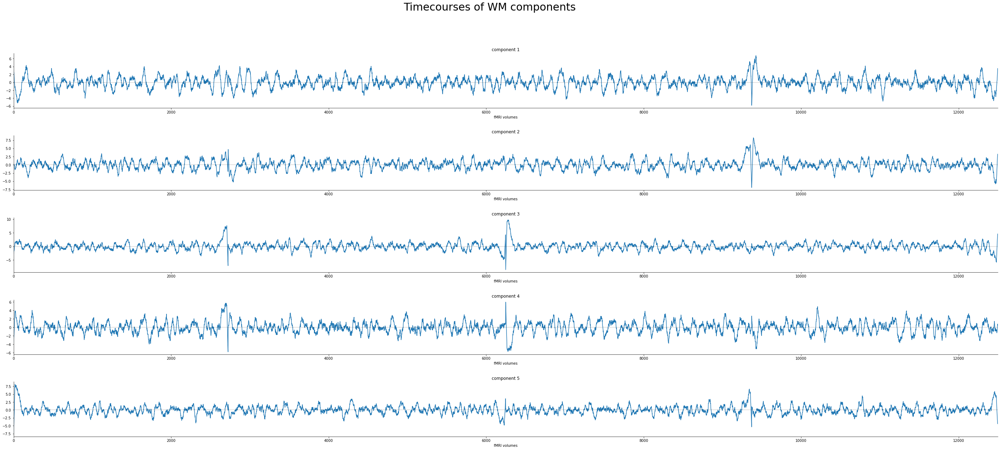

In [24]:
# White matter components

fig = plt.figure(figsize=(50,20))
# fig.suptitle("PCA WM")
gs1 = gridspec.GridSpec(wm_comp.shape[-1],1)
gs1.update(wspace=0.5, hspace=0.5)

step = 0
for i in np.arange(0,wm_comp.shape[-1]):
    if step != 0:
        g = fig.add_subplot(gs1[step], sharex=g)
    else:
        g = fig.add_subplot(gs1[step])

    g.plot(wm_comp[:,i])

    g.set_xlim((0,wm_comp[:,i].shape[0]))
    g.axhline(0, color='black', lw=0.25)
    format_graph("fMRI volumes", title=f'component {i+1}')

    step += 1
fig.suptitle("Timecourses of WM components", fontsize=30)
# plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-pca_wm.png'), transparant=True)    

Text(0.5, 0.98, 'Timecourses of CSF components')

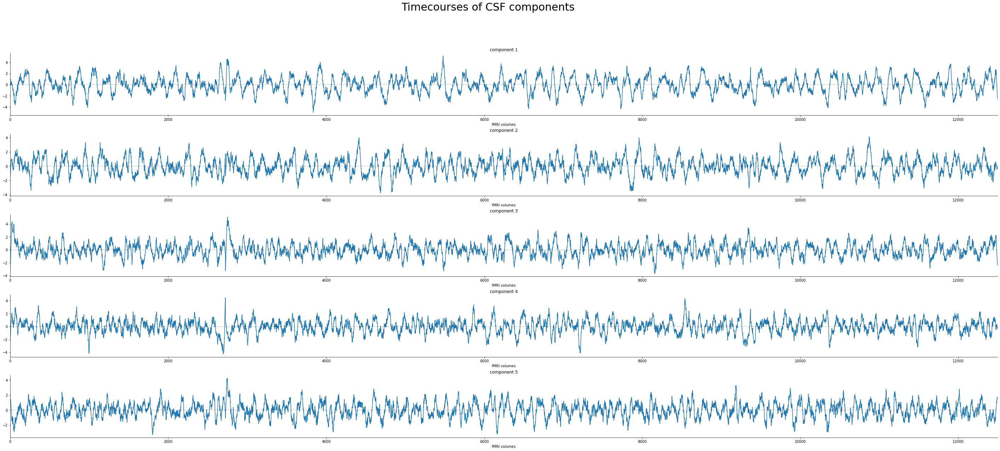

In [25]:
# CSF components

fig = plt.figure(figsize=(50,20))
# fig.suptitle("PCA WM")
gs1 = gridspec.GridSpec(csf_comp.shape[-1],1)
gs1.update(wspace=0.5, hspace=0.3)

step = 0
for i in np.arange(0,csf_comp.shape[-1]):
    if step != 0:
        g = fig.add_subplot(gs1[step], sharex=g)
    else:
        g = fig.add_subplot(gs1[step])

    g.plot(csf_comp[:,i])

    g.set_xlim((0,csf_comp[:,i].shape[0]))
    g.axhline(0, color='black', lw=0.25)
    format_graph("fMRI volumes", title=f'component {i+1}')

    step += 1

fig.suptitle("Timecourses of CSF components", fontsize=30)
# plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-pca_csf.png'), transparant=True)    

In [26]:
beam['line'].shape

(720, 16)

In [27]:
img_data = np.squeeze(line_data)
wm_vox_used = np.zeros_like(beam['wm'])
wm_vox_used[wm_vox,:] = 1
print(wm_vox_used.shape)

wm_img = np.zeros_like(img_data)
if np.all(np.around(img_data[:,360],3)==np.round(np.amax(img_data),3)):
    wm_img[:,352:368] = wm_vox_used
elif np.all(np.around(img_data[360,:],3)==np.round(np.amax(img_data),3)):
    wm_img[352:368,:] = wm_vox_used

csf_vox_used = np.zeros_like(beam['wm'])
csf_vox_used[csf_vox,:] = 1
print(csf_vox_used.shape)

csf_img = np.zeros_like(img_data)
if np.all(np.around(img_data[:,360],3)==np.round(np.amax(img_data),3)):
    csf_img[:,352:368] = csf_vox_used
elif np.all(np.around(img_data[360,:],3)==np.round(np.amax(img_data),3)):
    csf_img[352:368,:] = csf_vox_used

(720, 16)
(720, 16)


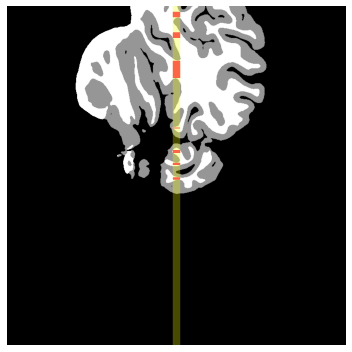

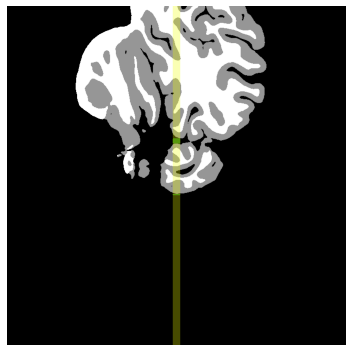

In [28]:
xx = 5
yy = 5

fig = plt.figure(figsize=(xx,yy))
axes = []
rows = 1
cols = len(df)
beam_cmap = utils.make_binary_cm(240,255,0)
cmapred = utils.make_binary_cm(1,0,0)
cmapgreen = utils.make_binary_cm(101/255,204/255,20/255)

for a in range(rows*cols):
    b = df[list(df.keys())[a]]

    axes.append(fig.add_subplot(rows,cols,a+1))
    plt.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r')
    plt.imshow(np.squeeze(b['line'].get_fdata()), alpha=0.3, cmap=beam_cmap)
    plt.imshow(wm_img, alpha=0.6, cmap=cmapred)
    axes[-1].axis('off')

fig.tight_layout()
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_vox-{which_vox}_desc-csf_voxels.png'), transparant=True)

fig = plt.figure(figsize=(xx,yy))
axes = []
rows = 1
cols = len(df)

for a in range(rows*cols):
    b = df[list(df.keys())[a]]

    axes.append(fig.add_subplot(rows,cols,a+1))
    plt.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r')
    plt.imshow(np.squeeze(b['line'].get_fdata()), alpha=0.3, cmap=beam_cmap)
    plt.imshow(csf_img, alpha=0.6, cmap=cmapgreen)
    axes[-1].axis('off')

fig.tight_layout()
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_vox-{which_vox}_desc-wm_voxels.png'), transparant=True)

In [29]:
# throw components in model
# pca_comps = np.concatenate((wm_comp, csf_comp), axis=1)
pca_comps = wm_comp

# # Z-score components: also if PCA is ran on z-scored data..?
# pca_zscore = []
# for kk in np.arange(0,pca_comps.shape[-1]):
#     pca_zscore.append(((pca_comps[:,kk] - pca_comps[:,kk].mean()) / pca_comps[:,kk].std())[:,np.newaxis])

# pca_zscore = np.squeeze(np.array(pca_zscore).T,axis=0)

pca_zscore = pca_comps
pca_comps_cols = [f'wm_{i}' for i in range(1,n_wm_comp+1)] # + [f'csf_{i}' for i in range(1,6)]

pca_df = pd.DataFrame(pca_zscore, columns=pca_comps_cols)
pca_df['subject'], pca_df['t'], pca_df['run'] = qq['subject'], qq['t'].values, qq['run']
pca_df = pca_df.set_index(['subject', 'run', 't'])
pca_df

wm_1      wm_2      wm_3      wm_4      wm_5
subject run t                                                        
1       1   0.000    3.358776  0.498823 -2.693062 -3.491126 -7.632233
            0.105    3.009024  0.240361 -2.574746 -2.940536 -6.929988
            0.210    2.657754 -0.118438 -2.030559 -2.736695 -6.000222
            0.315    2.509440  0.367211 -1.933131 -2.455485 -5.227187
            0.420    2.549693  0.200435 -1.822823 -2.245271 -4.058122
...                       ...       ...       ...       ...       ...
        4   327.495  1.727337  1.721362  2.465139 -0.289567 -3.009969
            327.600  2.100288  2.253317  2.969908  0.222941 -3.264671
            327.705  2.438015  2.523858  3.604418  0.792448 -3.793105
            327.810  2.817788  2.883964  4.145753  0.767457 -4.337604
            327.915  3.529702  3.258871  4.601163  0.463823 -4.376381

[12496 rows x 5 columns]

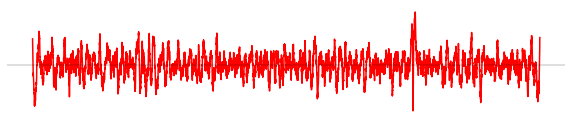

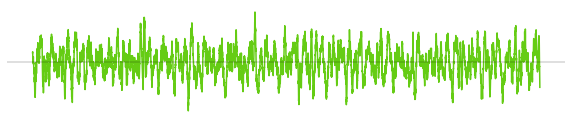

In [38]:
fig2,axs2 = plt.subplots(figsize=(10,2))
axs2.plot(wm_comp[:,0], color=(1,0,0))
axs2.axhline(0, color='black', lw=0.25)
axs2.axis('off')
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-wm_timecourse.png'), transparant=True)

fig2,axs2 = plt.subplots(figsize=(10,2))
axs2.plot(csf_comp[:,0], color='#65CC14')
axs2.axhline(0, color='black', lw=0.25)
axs2.axis('off')
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-csf_timecourse.png'), transparant=True)

## Modeling with and without confounds z-scored data

### With confounds

In [39]:
# Model fitting with confounds
##############################
print("\nPerform model fitting in nideconv")
with_conf = nd.GroupResponseFitter(data_zscore,
                                 onsets,
                                 input_sample_rate=fs,
                                 concatenate_runs=True,
                                 confounds=pca_df, add_intercept=False)

# Add event for each condition
cond = onsets.reset_index().event_type.unique()
[with_conf.add_event(i,
                  basis_set='fir',
                  interval=[min_int,max_int]) for i in cond]
           
with_conf.fit(progressbar=True)
print("\nDone")



Perform model fitting in nideconv
1it [00:01,  1.90s/it]
Done



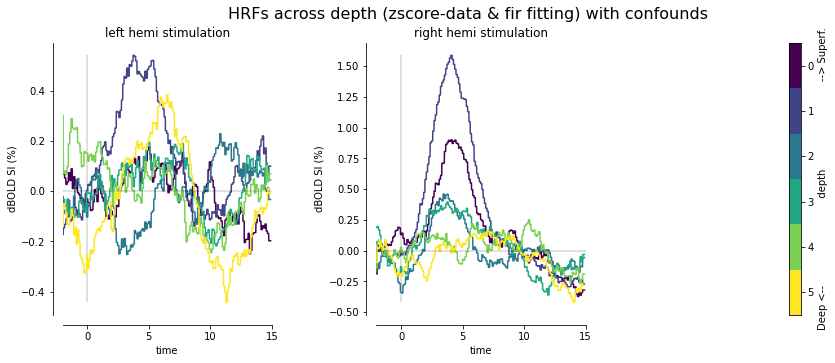

In [47]:
from colour import Color
from linescanning.bin.utils.utils import get_linerange
from matplotlib import cm

orient = ['wm', 'wm', 'pial']
hemi = 'left'
black = Color("black")
white = Color("red")

fig = plt.figure(figsize=(15,5))
gs1 = gridspec.GridSpec(len(run_subjects),3)
gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
subj = with_conf.get_subjectwise_timecourses()

step = 0

for sub in range(1,len(run_subjects)+1):

    subject = f"sub-{run_subjects[sub-1]}"

    r = [lower_bound,upper_bound]
    nr_vox = len(np.arange(r[0],r[1]+1,1))
    # colors = list(black.range_to(white, nr_vox))
    viridis = cm.get_cmap('viridis', nr_vox)

    # invert gradient if orient == pial
    if orient[sub-1] == "pial":
        colors.reverse()

    #---------------------------------------------------------------------------------------------------------------------------------------------
    # Loop through the dataframe    
    tmp = subj.reset_index()
    tmp = tmp[(tmp['subject'] == sub)]
    # subj_001 = subj_001 = subj.reset_index()
    tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

    for i,pp in enumerate(['left', 'right']):
        
        titles = ['left hemi stimulation', 'right hemi stimulation']
        
        vox_nr = 0
        min_val, max_val = 0,0
        g = fig.add_subplot(gs1[step])
        all_vox = []
        for x in np.arange(r[0],r[1]+1,1):
            tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
            yy = tmp.droplevel([0]).iloc[:, x][pp].values
            all_vox.append(yy)
            # get mimimum and maximum of graph for later formatting
            if min(yy) < min_val:
                min_val = min(yy)
            
            if max(yy) > max_val:
                max_val = max(yy)

            img = g.plot(tt,yy, color=viridis(vox_nr/nr_vox))
            # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color=colors[vox_nr].hex)
            format_graph('time', xlabel, axis=False, leg=False, box=False, title=titles[i], out=None)
            vox_nr += 1
    
        # g.axes.xaxis.set_ticklabels([])
        g.set_xlim((min_int, max_int))
        g.axhline(0, color='black', lw=0.25)
        g.vlines(x=0, ymin=min_val,ymax=max_val, color='black', lw=0.25)
        
        sns.despine(offset=10)

        interval = np.round(abs(min_val)+max_val/2,0)
        # g.set_yticks(list(np.arange(np.round(min_val,1), np.round(max_val,1),np.round(interval/4,2))))
        step += 1

    cb_axis = fig.add_subplot(gs1[step])
    cb_axis.imshow(np.arange(0,nr_vox,1)[:,np.newaxis], aspect=4)
    cb_axis.set_xticks([])
    cb_axis.yaxis.tick_right()
    cb_axis.yaxis.set_label_position('right')
    cb_axis.set_ylabel("Deep <--                            depth                            --> Superf.")

fig.suptitle("HRFs across depth (zscore-data & {} fitting) with confounds".format(fitting.lower()), fontsize=16)
plt.show()
# fig.axes.get_xaxis().set_ticks([])
fig.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-hrfs_withconfounds_zscore.png'), transparant=True)


Dealing with condition: left
Dealing with condition: right


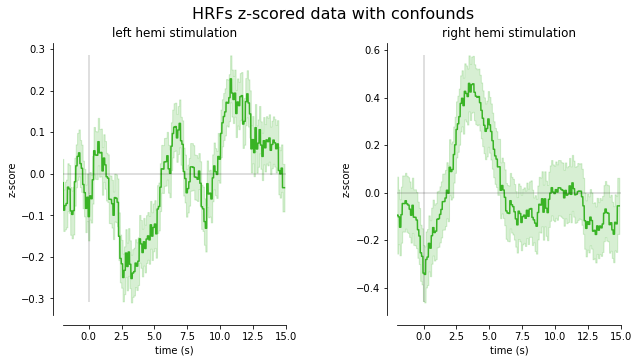

In [41]:
from colour import Color
from linescanning.bin.utils.utils import get_linerange, errorfill

fig = plt.figure(figsize=(10,5))
gs1 = gridspec.GridSpec(len(run_subjects),2)
gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
subj = with_conf.get_subjectwise_timecourses()
rfs = with_conf._get_response_fitters()
err = rfs.reset_index()[0][0].get_standard_errors_timecourse()
# tt = np.arange(0,20,TR/20)

step = 0

for sub in range(1,len(run_subjects)+1):

    subject = f"sub-{run_subjects[sub-1]}"

    r = [which_vox,which_vox]
    nr_vox = len(np.arange(r[0],r[1]+1,1))

    #---------------------------------------------------------------------------------------------------------------------------------------------
    # Loop through the dataframe    
    tmp = subj.reset_index()
    tmp = tmp[(tmp['subject'] == sub)]
    tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

    for i,pp in enumerate(['left', 'right']):
        
        print(f"Dealing with condition: {pp}")
        titles = ['left hemi stimulation', 'right hemi stimulation']
        
        vox_nr = 0
        g = fig.add_subplot(gs1[step])
        for x in np.arange(r[0],r[1]+1,1):
            # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color="#39B325")
            
            # get time axis, y axis (BOLD SI), and error values
            tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
            yy = tmp.droplevel([0]).iloc[:, x][pp].values
            error = err.iloc[:,x][pp].values

            # create plot with error bars based on response_fitter.get_standard_errors_timecourse
            errorfill(tt,yy, error, color="#39B325", alpha_fill=0.2)

            # do some additional formatting
            format_graph('time (s)', 'z-score', axis=False, leg=False, box=False, title=titles[i], out=None)
            
            vox_nr += 1

        # g.axes.xaxis.set_ticklabels([])
        g.set_xlim((min_int,max_int))
        g.axhline(0, color='black', lw=0.25)
        g.vlines(x=0, ymin=min(yy-error),ymax=max(yy+error), color='black', lw=0.25)
        # g.spines['left'].set_bounds(min(yy-error), max(yy+error))
        sns.despine(offset=10)
        # g.set_yticks(list(np.arange(np.round(min(yy-error),1), np.round(max(yy+error),1),0.5)))
        step += 1

    # plt.xticks(np.arange(0,10),1)
    handles, labels = g.axes.get_legend_handles_labels()
    fig.suptitle("HRFs z-scored data with confounds", fontsize=16)
    # fig.legend(handles,labels,loc='upper right', frameon=False)

# fig.axes.get_xaxis().set_ticks([])
# plt.savefig(os.path.join(base_dir, 'code', 'figures', f'{subject}_desc-hrfs_vox-360.png'), transparant=True)

### Without confounds

In [44]:
# Model fitting without confounds
#################################
print("\nPerform model fitting in nideconv")
no_conf = nd.GroupResponseFitter(data_zscore,
                                 onsets,
                                 input_sample_rate=fs,
                                 concatenate_runs=True,
                                 confounds=None, add_intercept=False)

# Add event for each condition
cond = onsets.reset_index().event_type.unique()
[no_conf.add_event(i,
                  basis_set='fir',
                  interval=[min_int,max_int]) for i in cond]
           
no_conf.fit(progressbar=True)
print("\nDone")


Perform model fitting in nideconv
1it [00:01,  1.94s/it]
Done



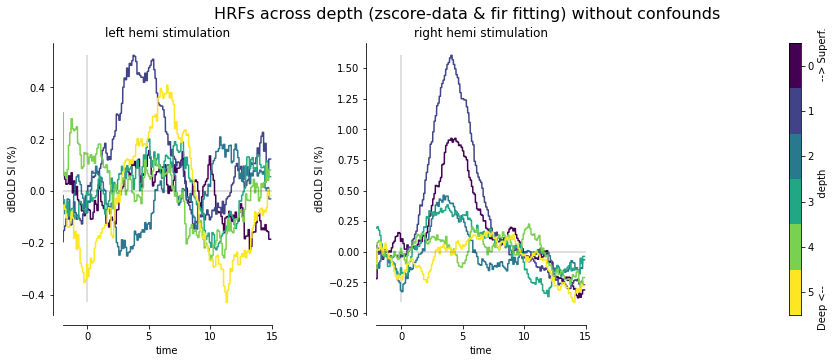

In [48]:
from colour import Color
from linescanning.bin.utils.utils import get_linerange
from matplotlib import cm

orient = ['wm', 'wm', 'pial']
hemi = 'left'
black = Color("black")
white = Color("red")

fig = plt.figure(figsize=(15,5))
gs1 = gridspec.GridSpec(len(run_subjects),3)
gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
subj = no_conf.get_subjectwise_timecourses()

step = 0

for sub in range(1,len(run_subjects)+1):

    subject = f"sub-{run_subjects[sub-1]}"

    r = [lower_bound,upper_bound]
    nr_vox = len(np.arange(r[0],r[1]+1,1))
    # colors = list(black.range_to(white, nr_vox))
    viridis = cm.get_cmap('viridis', nr_vox)

    # invert gradient if orient == pial
    if orient[sub-1] == "pial":
        colors.reverse()

    #---------------------------------------------------------------------------------------------------------------------------------------------
    # Loop through the dataframe    
    tmp = subj.reset_index()
    tmp = tmp[(tmp['subject'] == sub)]
    # subj_001 = subj_001 = subj.reset_index()
    tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

    for i,pp in enumerate(['left', 'right']):
        
        titles = ['left hemi stimulation', 'right hemi stimulation']
        
        vox_nr = 0
        min_val, max_val = 0,0
        g = fig.add_subplot(gs1[step])
        all_vox = []
        for x in np.arange(r[0],r[1]+1,1):
            tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
            yy = tmp.droplevel([0]).iloc[:, x][pp].values
            all_vox.append(yy)
            # get mimimum and maximum of graph for later formatting
            if min(yy) < min_val:
                min_val = min(yy)
            
            if max(yy) > max_val:
                max_val = max(yy)

            img = g.plot(tt,yy, color=viridis(vox_nr/nr_vox))
            # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color=colors[vox_nr].hex)
            format_graph('time', xlabel, axis=False, leg=False, box=False, title=titles[i], out=None)
            vox_nr += 1
    
        # g.axes.xaxis.set_ticklabels([])
        g.set_xlim((min_int, max_int))
        g.axhline(0, color='black', lw=0.25)
        g.vlines(x=0, ymin=min_val,ymax=max_val, color='black', lw=0.25)
        
        sns.despine(offset=10)

        interval = np.round(abs(min_val)+max_val/2,0)
        # g.set_yticks(list(np.arange(np.round(min_val,1), np.round(max_val,1),np.round(interval/4,2))))
        step += 1

    cb_axis = fig.add_subplot(gs1[step])
    cb_axis.imshow(np.arange(0,nr_vox,1)[:,np.newaxis], aspect=4)
    cb_axis.set_xticks([])
    cb_axis.yaxis.tick_right()
    cb_axis.yaxis.set_label_position('right')
    cb_axis.set_ylabel("Deep <--                            depth                            --> Superf.")

fig.suptitle("HRFs across depth (zscore-data & {} fitting) without confounds".format(fitting.lower()), fontsize=16)
plt.show()
# fig.axes.get_xaxis().set_ticks([])
fig.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-hrfs_withoutconfounds_zscore.png'), transparant=True)


Dealing with condition: left
Dealing with condition: right


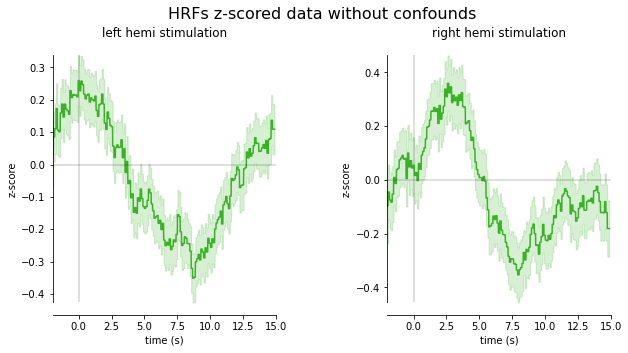

In [143]:
from colour import Color
from linescanning.bin.utils.utils import get_linerange, errorfill

fig = plt.figure(figsize=(10,5))
gs1 = gridspec.GridSpec(len(run_subjects),2)
gs1.update(wspace=0.5, hspace=0.3) # set the spacing between axes.
subj = no_conf.get_subjectwise_timecourses()
rfs = no_conf._get_response_fitters()
err = rfs.reset_index()[0][0].get_standard_errors_timecourse()
# tt = np.arange(0,20,TR/20)

step = 0

for sub in range(1,len(run_subjects)+1):

    subject = f"sub-{run_subjects[sub-1]}"

    r = [which_vox,which_vox]
    nr_vox = len(np.arange(r[0],r[1]+1,1))

    #---------------------------------------------------------------------------------------------------------------------------------------------
    # Loop through the dataframe    
    tmp = subj.reset_index()
    tmp = tmp[(tmp['subject'] == sub)]
    tmp = tmp.set_index(['subject', 'event type', 'covariate', 'time'])

    for i,pp in enumerate(['left', 'right']):
        
        print(f"Dealing with condition: {pp}")
        titles = ['left hemi stimulation', 'right hemi stimulation']
        
        vox_nr = 0
        g = fig.add_subplot(gs1[step])
        for x in np.arange(r[0],r[1]+1,1):
            # tmp.droplevel([0]).iloc[:, x][pp].plot(fig=g, sharex=True, color="#39B325")
            
            # get time axis, y axis (BOLD SI), and error values
            tt = tmp.droplevel([0]).iloc[:,x]['left'].reset_index()['time']
            yy = tmp.droplevel([0]).iloc[:, x][pp].values
            error = err.iloc[:,x][pp].values

            # create plot with error bars based on response_fitter.get_standard_errors_timecourse
            errorfill(tt,yy, error, color="#39B325", alpha_fill=0.2)

            # do some additional formatting
            format_graph('time (s)', 'z-score', axis=False, leg=False, box=False, title=titles[i], out=None)
            
            vox_nr += 1

        # g.axes.xaxis.set_ticklabels([])
        g.set_xlim((min_int,max_int))
        g.axhline(0, color='black', lw=0.25)
        g.vlines(x=0, ymin=min(yy-error),ymax=max(yy+error), color='black', lw=0.25)
        g.spines['left'].set_bounds(min(yy-error), max(yy+error))
        # g.set_yticks(list(np.arange(np.round(min(yy-error),1), np.round(max(yy+error),1),0.5)))
        step += 1

    # plt.xticks(np.arange(0,10),1)
    handles, labels = g.axes.get_legend_handles_labels()
    fig.suptitle("HRFs z-scored data without confounds", fontsize=16)
    # fig.legend(handles,labels,loc='upper right', frameon=False)

# fig.axes.get_xaxis().set_ticks([])
# plt.savefig(os.path.join(base_dir, 'code', 'figures', f'{subject}_desc-hrfs_vox-360.png'), transparant=True)


### Model parameters along the line

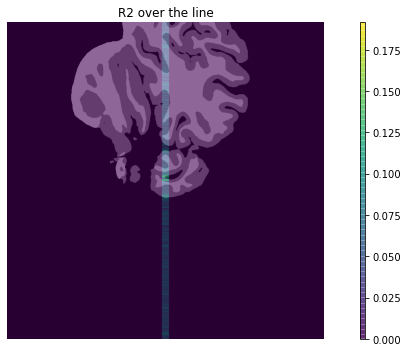

In [49]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

rsq = no_conf.get_rsq().values.T
rsq_beam = np.tile(rsq,16)

xx = 20
yy = 5

fig = plt.figure(figsize=(xx,yy))
gs1 = gridspec.GridSpec(1,2)
# gs1.update(wspace=-.5) # set the spacing between axes.

ax2 = fig.add_subplot(gs1[0])
ax2.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r')
ax2.set_title("R2 over the line")
data_rsq = np.squeeze(b['line'].get_fdata())
data_rsq[:,352:368] = rsq_beam

img = ax2.imshow(np.squeeze(data_rsq), alpha=0.6)
ax2.axis('off')
cb = fig.colorbar(img, ax=ax2, aspect=60)

plt.tight_layout()
plt.show()

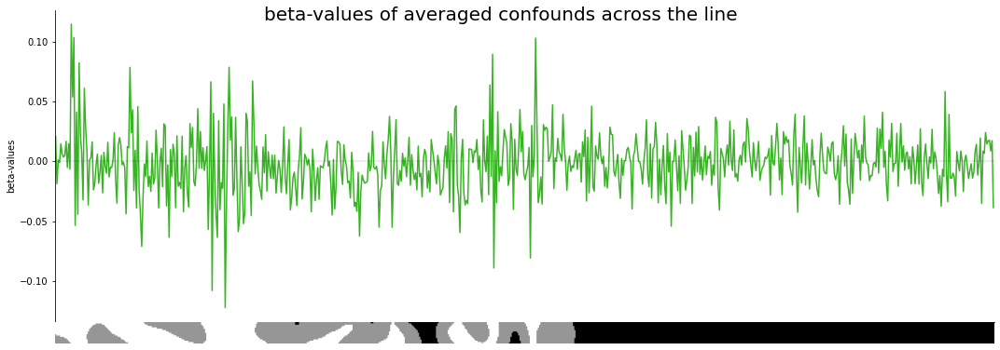

In [50]:
fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)

with_conf._get_response_fitters().reset_index()[0][0].betas.loc['confounds'].mean().T.plot(ax=ax1, color="#39B325")
format_graph("Voxels in the line", "beta-values")
fig.suptitle("beta-values of averaged confounds across the line", fontsize=20)
ax1.xaxis.set_visible(False)
ax1.axhline(0, color='black', lw=0.15)

ax2 = fig.add_subplot(211, sharex=ax1)
ax2.imshow(np.transpose(beam['cortex']), cmap="Greys_r")
ax2.axis('off')
plt.tight_layout(h_pad=-100)
plt.show()

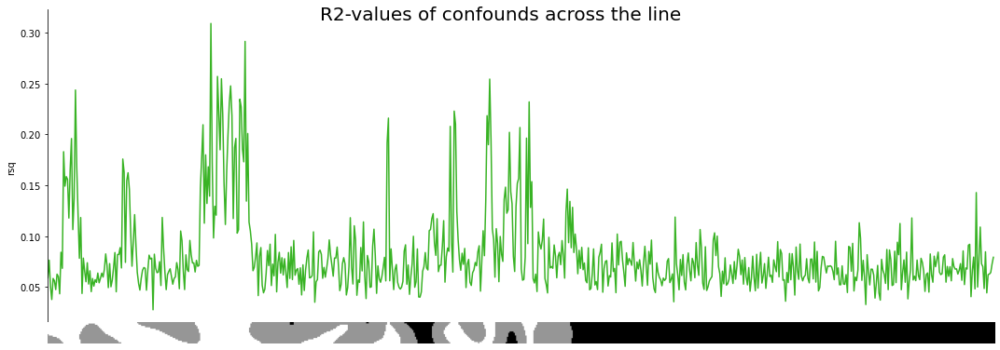

In [51]:
fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)

rsq = with_conf.get_rsq().values.T
ax1.plot(rsq, color="#39B325")
format_graph("Voxels in the line", "rsq")
fig.suptitle("R2-values of confounds across the line", fontsize=20)
ax1.xaxis.set_visible(False)
ax1.spines['bottom'].set_visible(False)

ax2 = fig.add_subplot(211, sharex=ax1)
ax2.imshow(np.transpose(beam['cortex']), cmap="Greys_r")
ax2.axis('off')
plt.tight_layout(h_pad=-100)
plt.show()

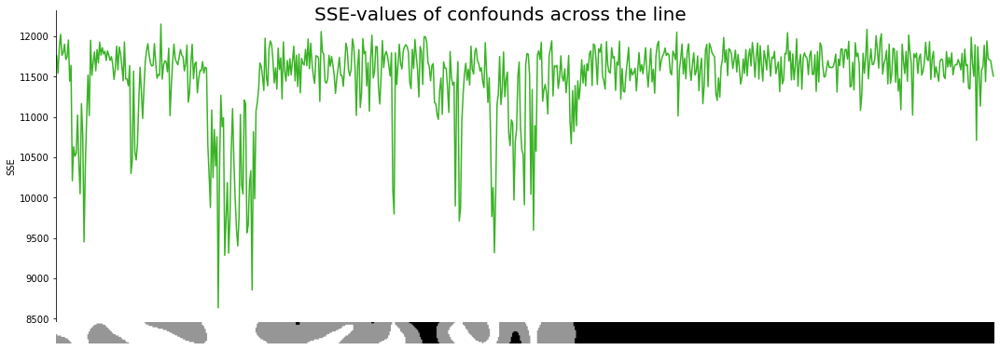

In [52]:
fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)

rsq = with_conf.get_sse().values.T
ax1.plot(rsq, color="#39B325")
format_graph("Voxels in the line", "SSE")
fig.suptitle("SSE-values of confounds across the line", fontsize=20)
ax1.xaxis.set_visible(False)
ax1.spines['bottom'].set_visible(False)

ax2 = fig.add_subplot(211, sharex=ax1)
ax2.imshow(np.transpose(beam['cortex']), cmap="Greys_r")
ax2.axis('off')
plt.tight_layout(h_pad=-100)
plt.show()

### Betas model with conf vs without

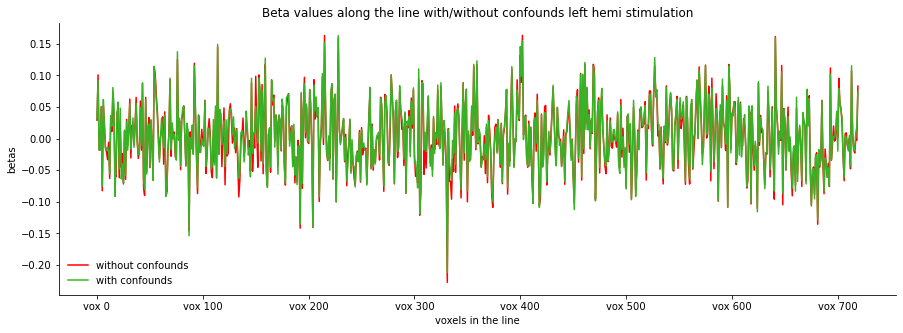

In [54]:
fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)

no_conf._get_response_fitters().reset_index()[0][0].betas.loc['left'].mean().T.plot(ax=ax1, color="#FF0000")
with_conf._get_response_fitters().reset_index()[0][0].betas.loc['left'].mean().T.plot(ax=ax1, color="#39B325")

format_graph("voxels in the line", "betas", title="Beta values along the line with/without confounds left hemi stimulation")
plt.legend(labels=['without confounds', 'with confounds'], frameon=False, loc='best')

fig.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-betas_left.png'), transparant=True)



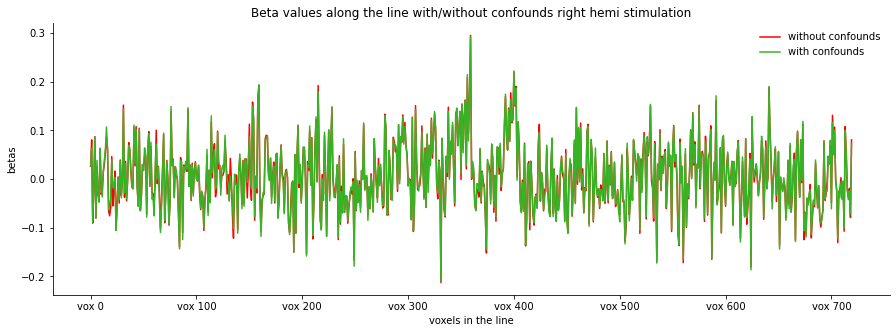

In [56]:
fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)

no_conf._get_response_fitters().reset_index()[0][0].betas.loc['right'].mean().T.plot(ax=ax1, color="#FF0000")
with_conf._get_response_fitters().reset_index()[0][0].betas.loc['right'].mean().T.plot(ax=ax1, color="#39B325")

format_graph("voxels in the line", "betas", title="Beta values along the line with/without confounds right hemi stimulation")
plt.legend(labels=['without confounds', 'with confounds'], frameon=False, loc='bottom left')
fig.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-betas_right.png'), transparant=True)

## Modeling without events

In [128]:
# Model fitting
###############
print("\nPerform model fitting in nideconv")
g_model = nd.GroupResponseFitter(data_zscore,
                                 onsets,
                                 input_sample_rate=fs,
                                 concatenate_runs=True,
                                 confounds=pca_df, add_intercept=False)
           
g_model.fit(progressbar=True)
print("\nDone")


Perform model fitting in nideconv
1it [00:00,  1.76it/s]
Done



In [129]:
cmapred = utils.make_binary_cm(1,0,0)
cmapblue = utils.make_binary_cm(0,0,1)
cmapgreen = utils.make_binary_cm(101/255,204/255,20/255)
cmapyellow = utils.make_binary_cm(65/255,100/255,100/255)

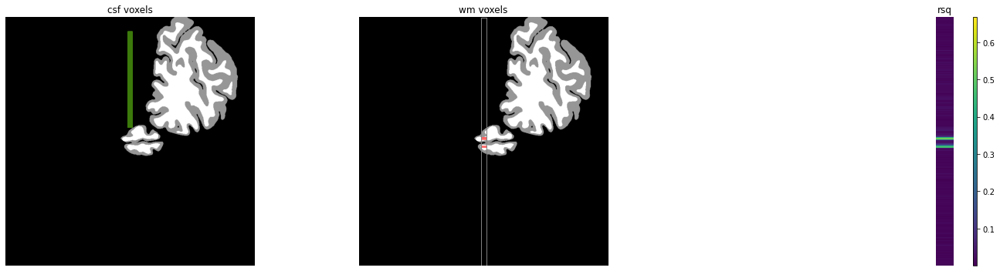

In [132]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patches as patches

rsq = g_model.get_rsq().values.T

xx = 20
yy = 5

fig = plt.figure(figsize=(xx,yy))
gs1 = gridspec.GridSpec(1,3)
# gs1.update(wspace=-.5) # set the spacing between axes.

box1 = patches.Rectangle((352,0),16,720,linewidth=1,edgecolor='grey', facecolor="None")

ax1 = fig.add_subplot(gs1[1])
ax1.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r')
ax1.set_title('wm voxels')
# ax1.imshow(np.squeeze(b['line'].get_fdata()), alpha=0.6)
ax1.add_patch(box1)
ax1.imshow(wm_img, alpha=0.6, cmap=cmapred)
ax1.axis('off')

box2 = patches.Rectangle((352,0),16,720,linewidth=1,edgecolor='grey', facecolor="None")
ax2 = fig.add_subplot(gs1[0])
ax1.add_patch(box2)
ax2.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r')
# ax2.imshow(np.squeeze(b['line'].get_fdata()), alpha=0.6)

ax2.imshow(csf_img, alpha=0.6, cmap=cmapgreen)
ax2.set_title('csf voxels')
ax2.axis('off')

ax3 = fig.add_subplot(gs1[2])
img = ax3.imshow(rsq,aspect=.02, cmap='viridis')
ax3.set_title('rsq')

cb = fig.colorbar(img, ax=ax3, aspect=60)
# fig.yaxis.set_ticks_position('left')
ax3.axis('off')

plt.tight_layout()
plt.show()

# plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-pca_model_no_events.png'), transparant=True)    

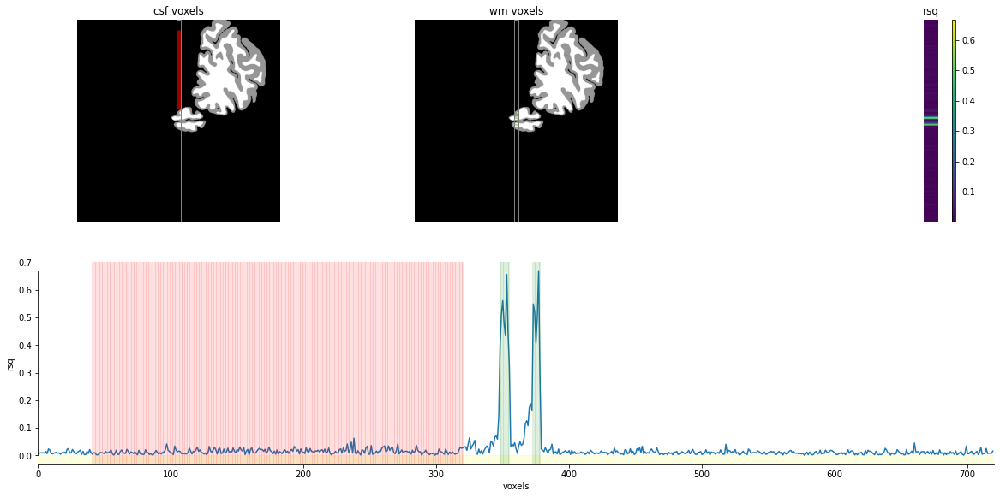

In [133]:
import matplotlib.patches as patches

full_fig = plt.figure(constrained_layout=True, figsize=(20,20))
gs = full_fig.add_gridspec(4,3)
csf_ax = full_fig.add_subplot(gs[1,0])
wm_ax = full_fig.add_subplot(gs[1,1])
rsq_ax = full_fig.add_subplot(gs[1,2])
rsq_tc_ax = full_fig.add_subplot(gs[2,:])
# beam_ax = full_fig.add_subplot(gs[3,:])

box1 = patches.Rectangle((352,0),16,720,linewidth=1,edgecolor='grey', facecolor="None")

wm_ax.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r')
wm_ax.set_title('wm voxels')
wm_ax.add_patch(box1)
wm_ax.imshow(wm_img, alpha=0.6, cmap=cmapgreen)
wm_ax.axis('off')

box2 = patches.Rectangle((352,0),16,720,linewidth=1,edgecolor='grey', facecolor="None")

csf_ax.imshow(np.squeeze(nb.load(b['cortex']).get_fdata()), cmap='Greys_r', aspect=1/5)
csf_ax.imshow(csf_img, alpha=0.6,cmap=cmapred)
csf_ax.add_patch(box2)
csf_ax.set_title('csf voxels')
csf_ax.axis('off')

img = rsq_ax.imshow(rsq,aspect=.02, cmap='viridis')
rsq_ax.set_title('rsq')
cb = fig.colorbar(img, ax=rsq_ax, aspect=60)

rsq_ax.axis('off')
rsq_tc_ax.plot(rsq)
for i in csf_vox:
    rsq_tc_ax.axvline(x=i,color='red', lw=0.25)

for i in wm_vox:
    rsq_tc_ax.axvline(x=i,color='green', lw=0.25)

rsq_tc_ax.set_xlim(0,wm_img.shape[0])
# format_graph("voxels", "rsq", title="R2 over voxels in a model with just wm|csf confounds (green = wm | red = csf)")
rsq_tc_ax.spines['left'].set_bounds(min(rsq), max(rsq))
rsq_tc_ax.set_xlabel("voxels")
rsq_tc_ax.set_ylabel("rsq")
rsq_tc_ax.spines['top'].set_visible(False)
rsq_tc_ax.spines['right'].set_visible(False)

cmap_line = cm.get_cmap('plasma')
color = cmap_line.colors[-1]

rect1 = patches.Rectangle((0,-1),720,1,linewidth=1,edgecolor=None,facecolor='r', alpha=0.15, color=color)
rsq_tc_ax.add_patch(rect1)

# beam_ax.imshow(np.ones((1,720)),cmap='magma',aspect=10)
# beam_ax.axis('off')
# # fig.yaxis.set_ticks_position('left')
# rsq_tc_ax.axis('off')

plt.show()

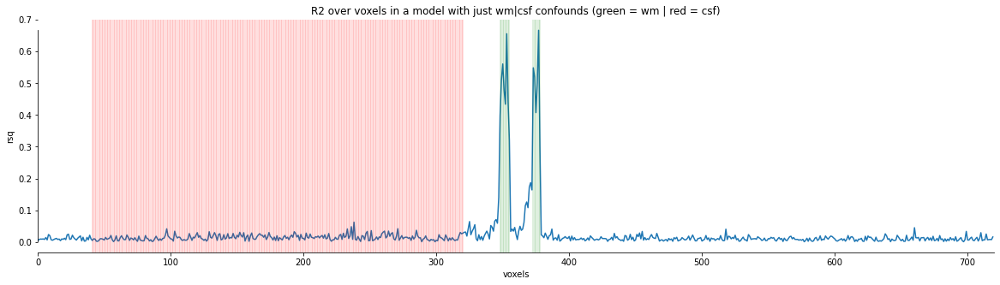

In [134]:
xx = 20
yy = 5

fig = plt.figure(figsize=(xx,yy))
ax1 = fig.add_subplot(111)
ax1.plot(rsq)

for i in csf_vox:
    ax1.axvline(x=i,color='red', lw=0.25)

for i in wm_vox:
    ax1.axvline(x=i,color='green', lw=0.25)

ax1.set_xlim(0,wm_img.shape[0])
format_graph("voxels", "rsq", title="R2 over voxels in a model with just wm|csf confounds (green = wm | red = csf)")
ax1.spines['left'].set_bounds(min(rsq), max(rsq))
# plt.plot(csf_img)
# plt.plot(wm_img)<
# plt.show()

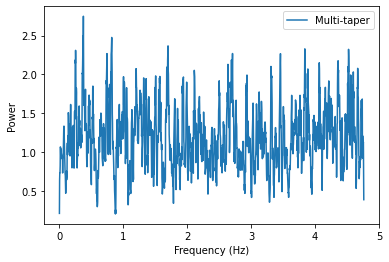

In [135]:
from nitime.timeseries import TimeSeries
from nitime.analysis import SpectralAnalyzer, FilterAnalyzer, NormalizationAnalyzer

T = TimeSeries(ts_magnitude, sampling_interval=TR)
S_original = SpectralAnalyzer(T)

fig01 = plt.figure()
ax01 = fig01.add_subplot(111)

# ax01.plot(S_original.psd[0],
#           S_original.psd[1][9],
#           label='Welch PSD')

# ax01.plot(S_original.spectrum_fourier[0],
#           np.abs(S_original.spectrum_fourier[1][9]),
#           label='FFT')

# ax01.plot(S_original.periodogram[0],
#           S_original.periodogram[1][9],
#           label='Periodogram')

ax01.plot(S_original.spectrum_multi_taper[0],
          S_original.spectrum_multi_taper[1][9],
          label='Multi-taper')

ax01.set_xlabel('Frequency (Hz)')
ax01.set_ylabel('Power')

ax01.legend()

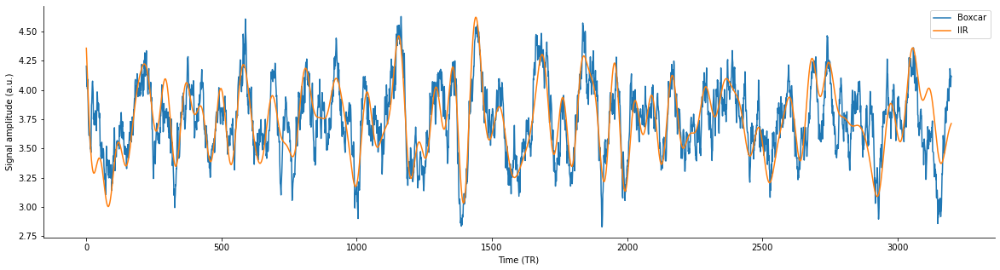

In [37]:
T  = TimeSeries(ts_magnitud[deleted_first_timepoints:]e, sampling_interval=TR)F = FilterAnalyzer(T, ub=0.15, lb=0.02)

# Initialize a figure to display the results:
fig02 = plt.figure(figsize=(20,5))
ax02 = fig02.add_subplot(1, 1, 1)

# Plot the original, unfiltered data:
# ax02.plot(F.data[0], label='unfiltered')

ax02.plot(F.filtered_boxcar.data[0], label='Boxcar')
# ax02.plot(F.fir.data[0], label='FIR')
ax02.plot(F.iir.data[0], label='IIR')
# ax02.plot(F.filtered_fourier.data[0], label='Fourier')
ax02.legend()
ax02.set_xlabel('Time (TR)')
ax02.set_ylabel('Signal amplitude (a.u.)')
format_graph()
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-filtered_tc.png'), transparant=True)

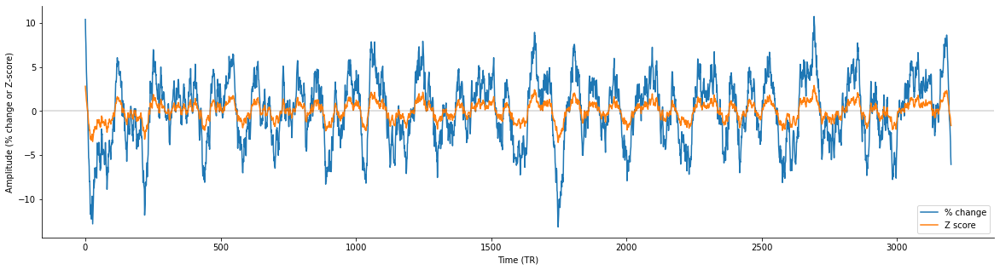

In [39]:
fig04 = plt.figure(figsize=(20,5))
ax04 = fig04.add_subplot(1, 1, 1)

ax04.plot(NormalizationAnalyzer(F.filtered_boxcar).percent_change.data[which_vox], label='% change')
ax04.plot(NormalizationAnalyzer(F.filtered_boxcar).z_score.data[which_vox], label='Z score')
ax04.legend()
ax04.set_xlabel('Time (TR)')
ax04.set_ylabel('Amplitude (% change or Z-score)')
ax04.axhline(0, color='black', lw=0.25)
format_graph()
# ax04.plot(ts_filtered.T)
plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-filtered_tc_psc.png'), transparant=True)

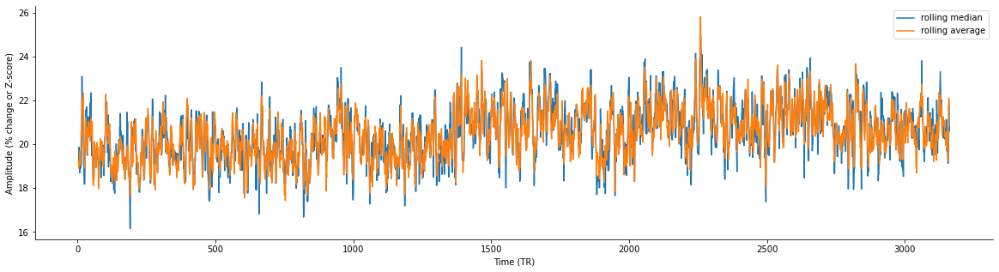

In [148]:
fig04 = plt.figure(figsize=(20,5))
ax04 = fig04.add_subplot(1, 1, 1)

ax04.plot(pd.Series(ts_magnitude[which_vox,deleted_first_timepoints:]).rolling(6).median(), label='rolling median')
ax04.plot(pd.Series(ts_magnitude[which_vox,deleted_first_timepoints:]).rolling(6).mean(), label='rolling average')
ax04.legend()
ax04.set_xlabel('Time (TR)')
ax04.set_ylabel('Amplitude (% change or Z-score)')
format_graph()
# ax04.plot(ts_filtered.T)
# plt.savefig(os.path.join(model_dir, subject, 'ses-2', f'{subject}_ses-2_desc-filtered_tc_psc.png'), transparant=True)